In [39]:
import os
from pathlib import Path
from operator import itemgetter
import pickle
import pydicom
from time import time
import pandas

import matplotlib.pyplot as plt
import numpy as np
import cv2
from shapely.geometry import Polygon, MultiPolygon, LineString, GeometryCollection, Point, MultiPoint
from shapely.affinity import translate

from catch_converter.parse_contours import parse_cvi42ws
from LazyLuna.Mini_LL import *
from LazyLuna.utils import *
from LazyLuna.Figures import *
from LazyLuna.Views import *

In [3]:
# basepaths
bp        = '/Users/dietrichhadler/Desktop/Daten/Fat'
bp_annos  = '/Users/dietrichhadler/Desktop/Daten/Fat/Gold'
bp_cases  = '/Users/dietrichhadler/Desktop/Daten/Fat/Cases'
bp_imgs   = '/Users/dietrichhadler/Desktop/Daten/Fat/Imgs'

ECSPRESS-070201907291813281.2.276.0.7230010.3.1.2.0.458.1575884951.477564: 2259 UIDs
   Finished processing of 1 / 30 subinstance UIDs.


/Users/dietrichhadler/opt/anaconda3/lib/python3.8/site-packages/descartes/patch.py:63: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  concatenate([asarray(t.exterior)[:, :2]] +


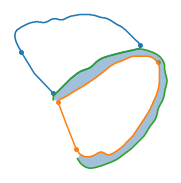

   Finished processing of 2 / 30 subinstance UIDs.


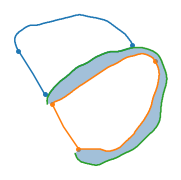

   Finished processing of 3 / 30 subinstance UIDs.


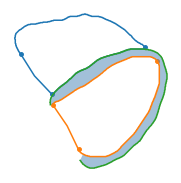

   Finished processing of 4 / 30 subinstance UIDs.


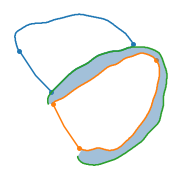

   Finished processing of 5 / 30 subinstance UIDs.


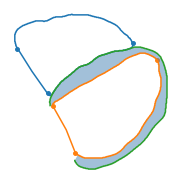

   Finished processing of 6 / 30 subinstance UIDs.


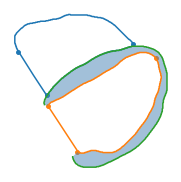

   Finished processing of 7 / 30 subinstance UIDs.


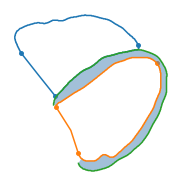

   Finished processing of 8 / 30 subinstance UIDs.


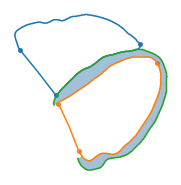

   Finished processing of 9 / 30 subinstance UIDs.


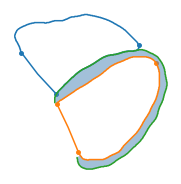

   Finished processing of 10 / 30 subinstance UIDs.


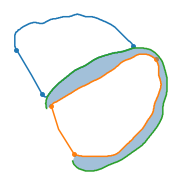

   Finished processing of 11 / 30 subinstance UIDs.


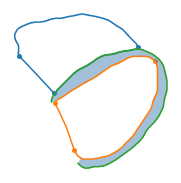

   Finished processing of 12 / 30 subinstance UIDs.


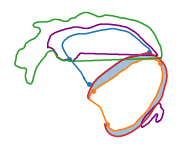

   Finished processing of 13 / 30 subinstance UIDs.


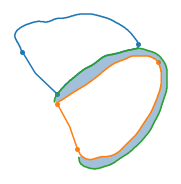

   Finished processing of 14 / 30 subinstance UIDs.


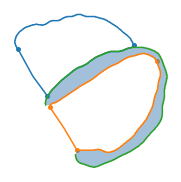

   Finished processing of 15 / 30 subinstance UIDs.


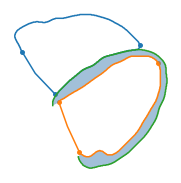

   Finished processing of 16 / 30 subinstance UIDs.


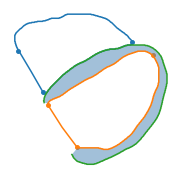

   Finished processing of 17 / 30 subinstance UIDs.


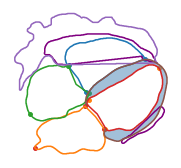

   Finished processing of 18 / 30 subinstance UIDs.


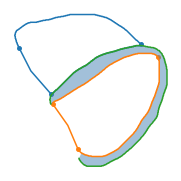

   Finished processing of 19 / 30 subinstance UIDs.


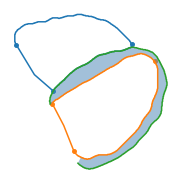

   Finished processing of 20 / 30 subinstance UIDs.


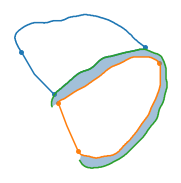

   Finished processing of 21 / 30 subinstance UIDs.


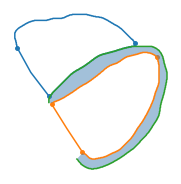

   Finished processing of 22 / 30 subinstance UIDs.


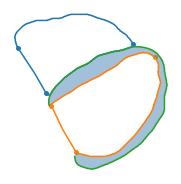

   Finished processing of 23 / 30 subinstance UIDs.


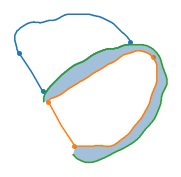

   Finished processing of 24 / 30 subinstance UIDs.


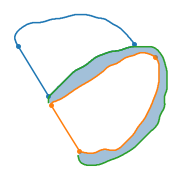

   Finished processing of 25 / 30 subinstance UIDs.


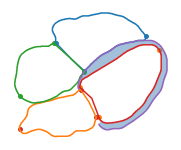

   Finished processing of 26 / 30 subinstance UIDs.


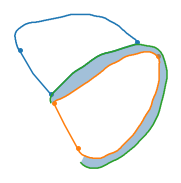

   Finished processing of 27 / 30 subinstance UIDs.


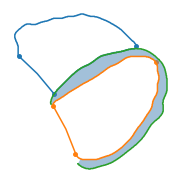

   Finished processing of 28 / 30 subinstance UIDs.


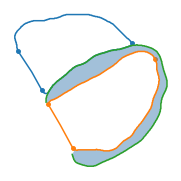

   Finished processing of 29 / 30 subinstance UIDs.


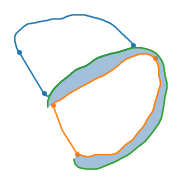

   Finished processing of 30 / 30 subinstance UIDs.


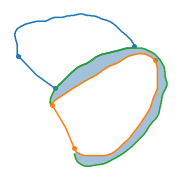

   222 Contours/Points collected for 30 different UIDs
   Converting the workspace took 6.784259796142578 seconds

ECSPRESS-068201907291434081.2.276.0.7230010.3.1.2.0.458.1575884906.473885: 1898 UIDs
   Finished processing of 1 / 60 subinstance UIDs.


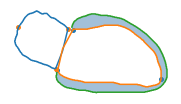

   Finished processing of 2 / 60 subinstance UIDs.


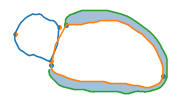

   Finished processing of 3 / 60 subinstance UIDs.


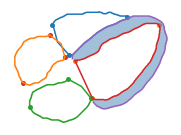

   Finished processing of 4 / 60 subinstance UIDs.


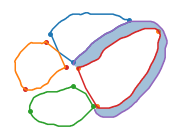

   Finished processing of 5 / 60 subinstance UIDs.


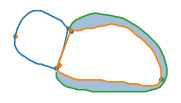

   Finished processing of 6 / 60 subinstance UIDs.


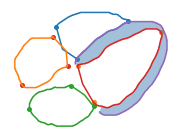

   Finished processing of 7 / 60 subinstance UIDs.


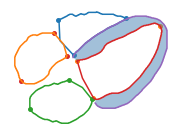

   Finished processing of 8 / 60 subinstance UIDs.


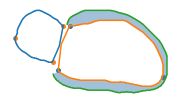

   Finished processing of 9 / 60 subinstance UIDs.


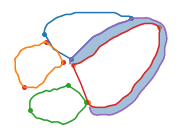

   Finished processing of 10 / 60 subinstance UIDs.


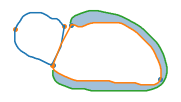

   Finished processing of 11 / 60 subinstance UIDs.


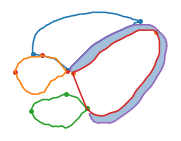

   Finished processing of 12 / 60 subinstance UIDs.


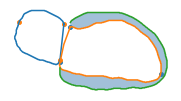

   Finished processing of 13 / 60 subinstance UIDs.


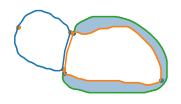

   Finished processing of 14 / 60 subinstance UIDs.


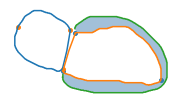

   Finished processing of 15 / 60 subinstance UIDs.


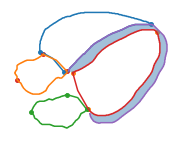

   Finished processing of 16 / 60 subinstance UIDs.


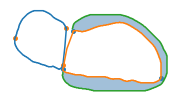

   Finished processing of 17 / 60 subinstance UIDs.


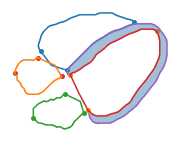

   Finished processing of 18 / 60 subinstance UIDs.


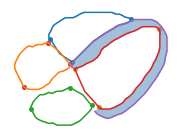

   Finished processing of 19 / 60 subinstance UIDs.


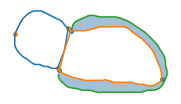

   Finished processing of 20 / 60 subinstance UIDs.


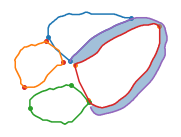

   Finished processing of 21 / 60 subinstance UIDs.


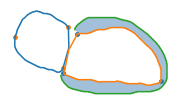

   Finished processing of 22 / 60 subinstance UIDs.


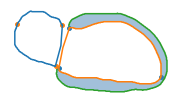

   Finished processing of 23 / 60 subinstance UIDs.


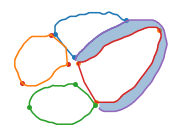

   Finished processing of 24 / 60 subinstance UIDs.


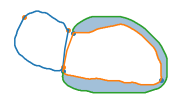

   Finished processing of 25 / 60 subinstance UIDs.


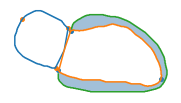

   Finished processing of 26 / 60 subinstance UIDs.


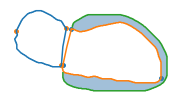

   Finished processing of 27 / 60 subinstance UIDs.


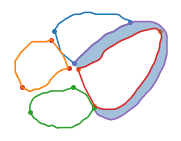

   Finished processing of 28 / 60 subinstance UIDs.


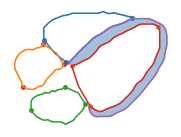

   Finished processing of 29 / 60 subinstance UIDs.


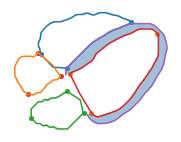

   Finished processing of 30 / 60 subinstance UIDs.


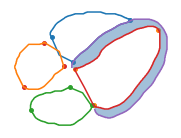

   Finished processing of 31 / 60 subinstance UIDs.


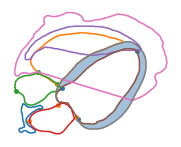

   Finished processing of 32 / 60 subinstance UIDs.


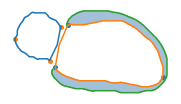

   Finished processing of 33 / 60 subinstance UIDs.


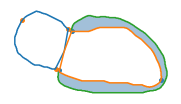

   Finished processing of 34 / 60 subinstance UIDs.


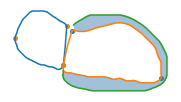

   Finished processing of 35 / 60 subinstance UIDs.


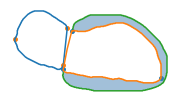

   Finished processing of 36 / 60 subinstance UIDs.


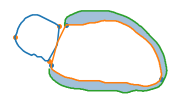

   Finished processing of 37 / 60 subinstance UIDs.


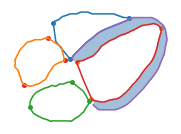

   Finished processing of 38 / 60 subinstance UIDs.


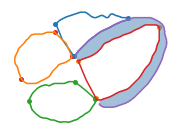

   Finished processing of 39 / 60 subinstance UIDs.


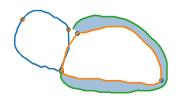

   Finished processing of 40 / 60 subinstance UIDs.


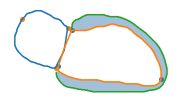

   Finished processing of 41 / 60 subinstance UIDs.


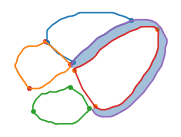

   Finished processing of 42 / 60 subinstance UIDs.


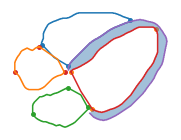

   Finished processing of 43 / 60 subinstance UIDs.


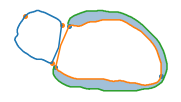

   Finished processing of 44 / 60 subinstance UIDs.


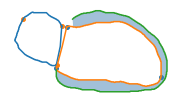

   Finished processing of 45 / 60 subinstance UIDs.


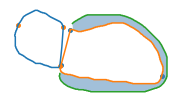

   Finished processing of 46 / 60 subinstance UIDs.


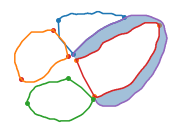

   Finished processing of 47 / 60 subinstance UIDs.


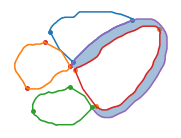

   Finished processing of 48 / 60 subinstance UIDs.


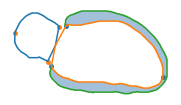

   Finished processing of 49 / 60 subinstance UIDs.


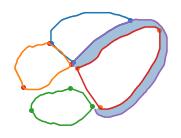

   Finished processing of 50 / 60 subinstance UIDs.


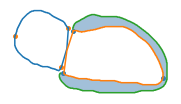

   Finished processing of 51 / 60 subinstance UIDs.


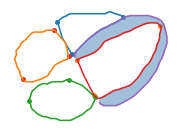

   Finished processing of 52 / 60 subinstance UIDs.


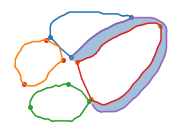

   Finished processing of 53 / 60 subinstance UIDs.


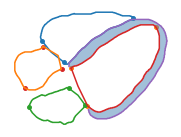

   Finished processing of 54 / 60 subinstance UIDs.


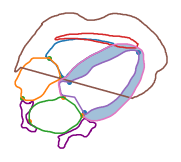

   Finished processing of 55 / 60 subinstance UIDs.


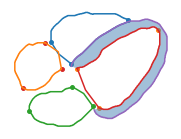

   Finished processing of 56 / 60 subinstance UIDs.


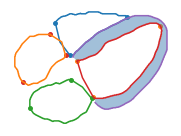

   Finished processing of 57 / 60 subinstance UIDs.


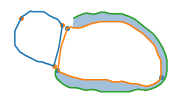

   Finished processing of 58 / 60 subinstance UIDs.


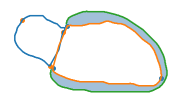

   Finished processing of 59 / 60 subinstance UIDs.


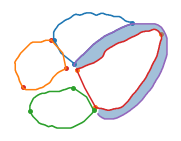

   Finished processing of 60 / 60 subinstance UIDs.


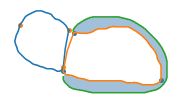

   544 Contours/Points collected for 60 different UIDs
   Converting the workspace took 12.248999834060669 seconds



In [15]:
parse_cvi42ws(bp_annos, bp_annos, process=True, debug=True)

In [8]:
lax_cine_view = LAX_CINE_View()
cases = []

# get the paths of imgs and annotations via SeriesInstanceUIDs
paths = get_imgs_and_annotation_paths(bp_imgs, bp_annos)
for imgp, annop in paths:
    #if not '1.3.12.2.1107.5.2.43.167071.30000021082405410237400000007' in annop: continue
    try:
        print(imgp, annop)
        st = time()
        case = Case(imgp, annop, os.path.basename(imgp), os.path.basename(bp_annos))
        case = lax_cine_view.initialize_case(case)
        case.store(bp_cases)
        cases.append(case)
        print('Case customization took: ', time()-st, 'Case: ', case.reader_name, case.case_name)
    except Exception as e:
        print('Failed at: ', imgp, annop, ' , Exception: ', e)
    print()

/Users/dietrichhadler/Desktop/Daten/Fat/Imgs/ECSPRESS-070 /Users/dietrichhadler/Desktop/Daten/Fat/Gold/1.2.276.0.7230010.3.1.2.0.458.1575884951.477564
Case customization took:  13.203735113143921 Case:  Gold ECSPRESS-070

/Users/dietrichhadler/Desktop/Daten/Fat/Imgs/ECSPRESS-068 /Users/dietrichhadler/Desktop/Daten/Fat/Gold/1.2.276.0.7230010.3.1.2.0.458.1575884906.473885
Case customization took:  13.601996898651123 Case:  Gold ECSPRESS-068



In [10]:
cases = [pickle.load(open(os.path.join(bp_cases, p), 'rb')) for p in os.listdir(bp_cases)]
view  = LAX_CINE_View()
cases = [view.customize_case(c) for c in cases if c.reader_name=='Gold']
print(len(cases))

2


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'ra', 'laxRvExtentPoints', 'la', 'lv_lax_extent', 'lv_lax_endo', 'laxLaExtentPoints', 'laxRaExtentPoints', 'lv_lax_epi'])


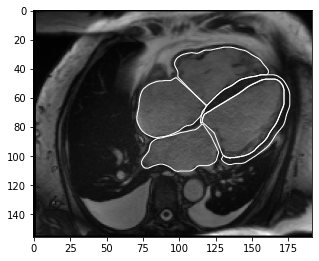


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


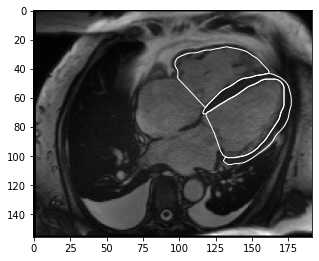


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


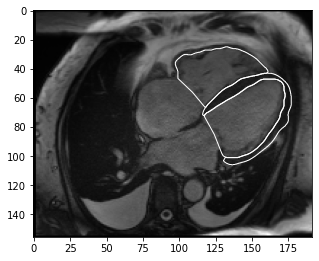


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


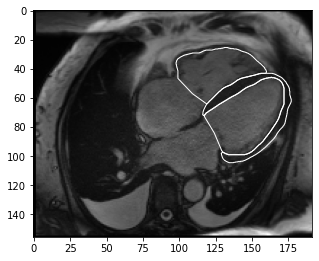


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


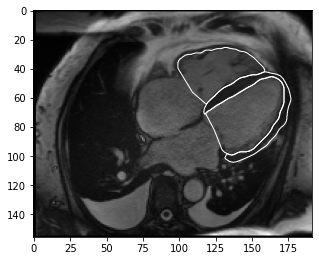


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


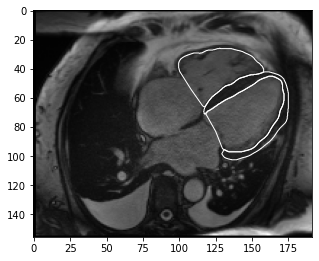


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


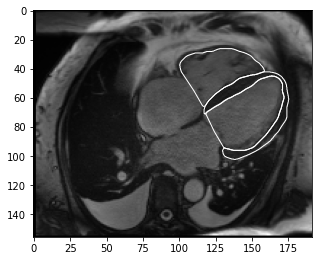


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


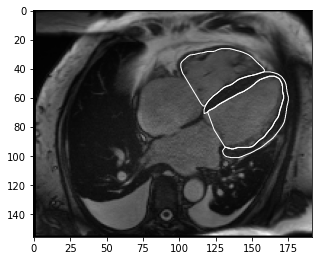


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


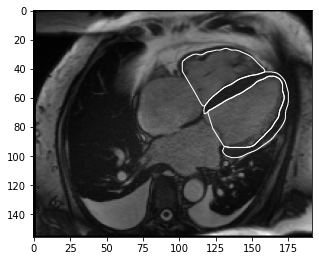


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


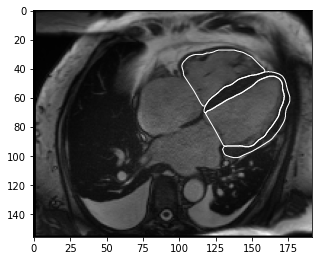


dict_keys(['info', 'lv_lax_myo', 'Epi', 'rv_lax_endo', 'ra', 'laxRvExtentPoints', 'la', 'lv_lax_extent', 'lv_lax_endo', 'laxLaExtentPoints', 'laxRaExtentPoints', 'Peri', 'lv_lax_epi'])


/Users/dietrichhadler/opt/anaconda3/lib/python3.8/site-packages/descartes/patch.py:46: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polygon = [Polygon(p) for p in polygon]


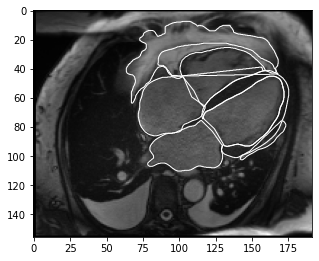


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


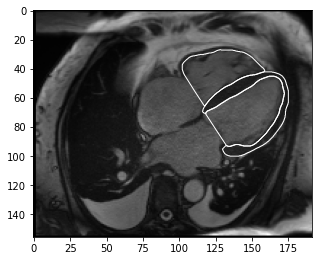


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


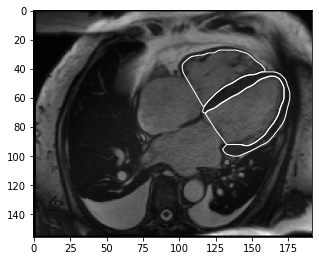


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


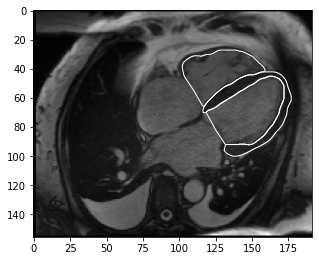


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


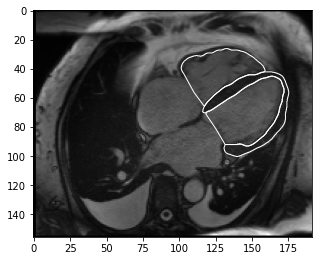


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


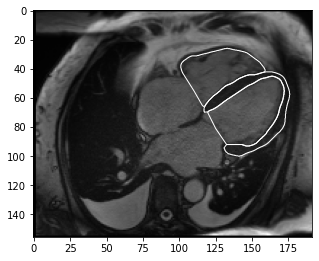


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


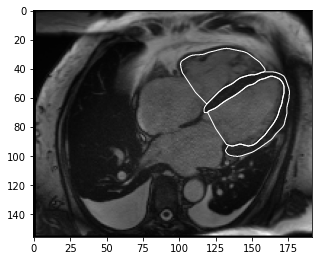


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


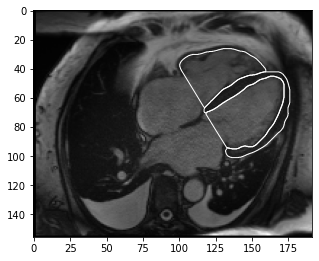


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


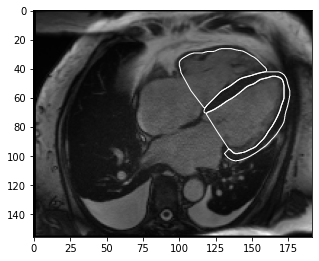


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


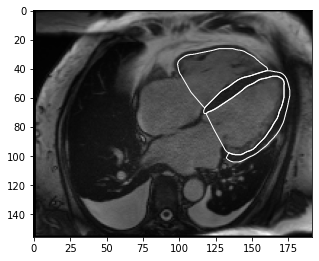


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


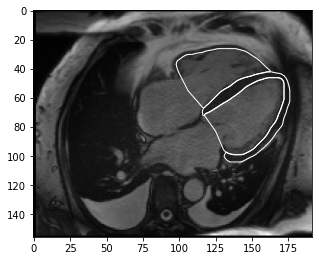


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


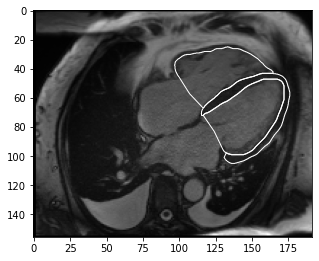


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


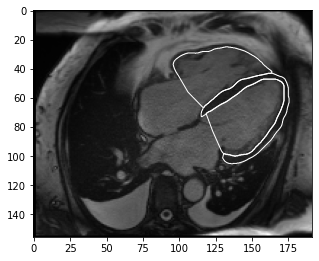


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


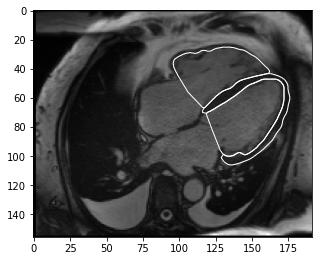


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


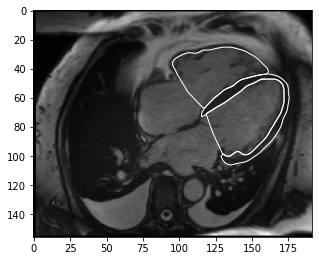


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


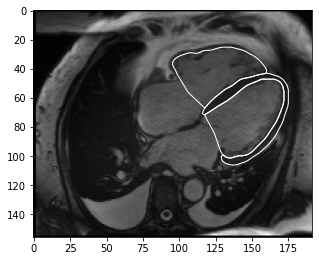


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


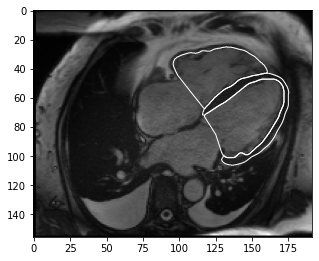


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


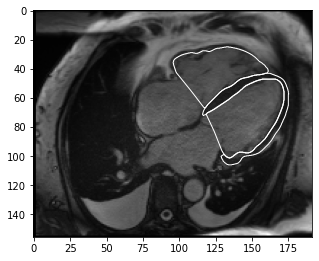


dict_keys(['info', 'lv_lax_myo', 'Epi', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'Peri', 'lv_lax_epi'])


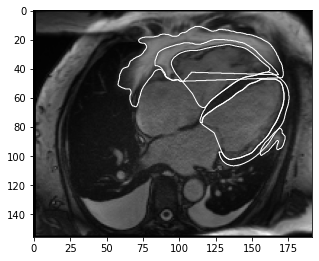


dict_keys(['info', 'lv_lax_myo', 'rv_lax_endo', 'laxRvExtentPoints', 'lv_lax_extent', 'lv_lax_endo', 'lv_lax_epi'])


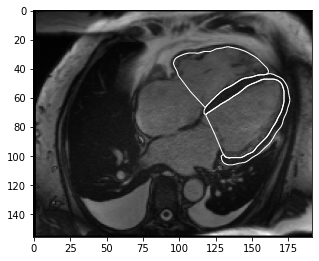

In [17]:
case = cases[0]
cats = case.categories
#print([c for c in cats if 'LAX 4CV' in c.name])
cat = [c for c in cats if 'LAX 4CV' in c.name][0]
for p in range(cat.nr_phases):
    print(cat.get_anno(0,p).anno.keys())
    img  = cat.get_img(0,p)
    anno = cat.get_anno(0,p)
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    ax.imshow(img, cmap='gray')
    anno.plot_all_contour_outlines(ax)
    plt.show()
    print()
    #break

In [40]:
from tensorflow.keras.utils import Sequence
import imgaug
from imgaug.augmentables.batches import UnnormalizedBatch
from imgaug import augmenters as iaa

import math

# custom z score augmenter
def func_images(images, random_state, parents, hooks):
    return [(image-np.mean(image)) / np.std(image) for image in images]
def func_polygons(polygons_on_images, random_state, parents, hooks):
    return polygons_on_images
custom_zscore_augmenter = iaa.Lambda(func_images=func_images, func_polygons=func_polygons)

# order is important 
aug = iaa.Sequential([
    iaa.PadToFixedSize(width=360, height=360, position='center', pad_mode=["linear_ramp"]), #constant, edge, linear_ramp, maximum, median, minimum, reflect, symmetric, wrap
    iaa.Sometimes(0.6, iaa.Affine(rotate = (-180, 180), scale = {"x": (0.8, 1.2), "y": (0.8, 1.2)})),      # rotation and scaling performed quite often
    iaa.Fliplr(0.5),
    iaa.Sometimes(0.6, iaa.Affine(translate_percent={"x": (-0.07, 0.07), "y": (-0.07, 0.07)}, shear=(-5, 5))), # translation and shearing occurs, but not as often
    iaa.CropToFixedSize(width=192, height=192, position='center'),
    custom_zscore_augmenter,                                                  # a custom zscore is applied (see above) after cropping, otherwise the means/variances are distorted significantly
    iaa.Sometimes(0.15, iaa.AveragePooling(((1, 2), (1, 2)))),                # average pooling mimics a downsampling of the x or y axis
    iaa.Sometimes(0.25, iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.07))), # some noise, 0.2 definitely too high, 0.05 not visible, 0.07 looks good
    iaa.Sometimes(0.25, iaa.GaussianBlur(sigma=(0, 1.5))),                    # weak blur and occasionally (1.5% of cases) strong blur
    iaa.Sometimes(0.25, iaa.Multiply((0.7, 1.3))),                             # brightness 
    iaa.Sometimes(0.25, iaa.LinearContrast((0.7, 1.4))),                      # contrast augmentation
], random_order=False)                                                        # apply augmenters in random order

# order is important 
no_aug = iaa.Sequential([
    iaa.PadToFixedSize( width=360, height=360, position='center', pad_mode=["linear_ramp"]), #constant, edge, linear_ramp, maximum, median, minimum, reflect, symmetric, wrap
    iaa.CropToFixedSize(width=192, height=192, position='center'),
    custom_zscore_augmenter,                                                  # a custom zscore is applied (see above) after cropping, 
], random_order=False)                                                        # apply augmenters in random order

In [44]:
class CatchGenerator(Sequence):
    def __init__(self, basepath, epochs_max, batch_size, k, k_max, provide_validation_set, aug, no_aug):
        self.basepath = basepath
        case_paths = [p for p in os.listdir(self.basepath) if p.endswith('.pickle')]
        self.cases = [pickle.load(open(os.path.join(basepath, fname), 'rb')) for fname in case_paths]
        self.cases = [c for c in self.cases if c.reader_name=='Gold']
        print('Nr of cases: ', len(self.cases))
        lax_cine_view = LAX_CINE_View()
        self.cases = [lax_cine_view.customize_case(case) for case in self.cases]
        self.tr_cases, self.val_cases = self.get_kcross_datasets(self.cases, k, k_max)
        self.epochs_max = epochs_max
        self.batch_size = batch_size
        self.aug        = aug
        self.no_aug     = no_aug
        self.k, self.k_max          = k, k_max
        self.provide_validation_set = provide_validation_set
        self.gen = self._multiprocessing_augmented_batches()
        
    def __len__(self):
        cases = self.val_cases if self.provide_validation_set else self.tr_cases
        return math.ceil(sum(2 for case in cases) / self.batch_size)
        
    def get_kcross_datasets(self, cases, k, k_max):
        n           = len(cases)
        k_nr        = n // k_max
        # HACKED FOR IDEATION STAGE ### TODO, correct ###
        train_cases = cases
        val_cases   = cases
        return train_cases, val_cases
    
    def _unaugmented_batch(self):
        scale = 1.0
        cases = self.val_cases if self.provide_validation_set else self.tr_cases
        imgs, polys = [], []
        for i in range(self.batch_size):
            case    = cases[np.random.randint(0, len(cases))]
            cats    = [c for c in case.categories if 'LAX 4CV' in c.name]
            cat     = cats[np.random.randint(0, len(cats))]
            d       = np.random.randint(0, cat.nr_slices)
            p       = cat.get_phase()
            img     = cat.get_img(d, p).astype(np.float32)
            h, w    = img.shape
            #img     = cv2.resize(img, (int(np.round(w*scale)), int(np.round(h*scale))), interpolation=cv2.INTER_CUBIC)
            anno    = cat.get_anno(d, p)
            lv_ext  = anno.get_point('lv_lax_extent')     if anno.has_point('lv_lax_extent')     else None
            ra_ext  = anno.get_point('laxRaExtentPoints') if anno.has_point('laxRaExtentPoints') else None
            la_ext  = anno.get_point('laxLaExtentPoints') if anno.has_point('laxLaExtentPoints') else None
            
            if anno.has_point('lv_lax_extent'): 
                lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                lv_ext1 = imgaug.augmentables.polys.Polygon(np.array(lv_ext1), 'lv_ext1')
                lv_ext2 = imgaug.augmentables.polys.Polygon(np.array(lv_ext2), 'lv_ext2')
                lv_ext3 = imgaug.augmentables.polys.Polygon(np.array(lv_ext3), 'lv_ext3')
            
            if anno.has_point('laxRaExtentPoints'):
                ra_ext1 = ra_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                ra_ext2 = ra_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                ra_ext3 = ra_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                ra_ext1 = imgaug.augmentables.polys.Polygon(np.array(ra_ext1), 'ra_ext1')
                ra_ext2 = imgaug.augmentables.polys.Polygon(np.array(ra_ext2), 'ra_ext2')
                ra_ext3 = imgaug.augmentables.polys.Polygon(np.array(ra_ext3), 'ra_ext3')
            
            if anno.has_point('laxLaExtentPoints'):
                la_ext1 = la_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                la_ext2 = la_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                la_ext3 = la_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
                la_ext1 = imgaug.augmentables.polys.Polygon(np.array(la_ext1), 'la_ext1')
                la_ext2 = imgaug.augmentables.polys.Polygon(np.array(la_ext2), 'la_ext2')
                la_ext3 = imgaug.augmentables.polys.Polygon(np.array(la_ext3), 'la_ext3')
            
            poly    = [c for c in [lv_ext1, lv_ext2, lv_ext3, ra_ext1, ra_ext2, ra_ext3, la_ext1, la_ext2, la_ext3] if c]
            imgs.append(img); polys.append(poly)
        return imgs, polys
    
    def _make_unaugmented_batch(self, imgs, polys):
        batch = UnnormalizedBatch(images=imgs, polygons=polys)
        return batch
    
    def _unaugmented_batch_generator(self):
        for i in range(len(self)+1):
            imgs, polys = self._unaugmented_batch()
            batch = self._make_unaugmented_batch(imgs, polys)
            yield batch
            
    def _multiprocessing_augmented_batches(self):
        unaug  = self._unaugmented_batch_generator()
        for i, batch in enumerate(unaug):
            imgs1  = batch.images_unaug
            polys1 = batch.polygons_unaug
            batches_aug = list(self.aug.augment_batches(batch, background=False))  # list() converts generator to list
            imgs        = batches_aug[0].images_aug
            polys       = batches_aug[0].polygons_aug
            img_batch, mask_batch = [], []
            for j in range(batch_size):
                img, poly = imgs[j], polys[j]
                h, w = img.shape
                mask = np.zeros((h, w, 9))
                for k in range(len(poly)):
                    mask[:,:,k] = utils.to_mask(poly[k].to_shapely_polygon(), h, w)
                    #mask[:,:,k] = cv2.GaussianBlur(mask[:,:,k],(5,5),cv2.BORDER_CONSTANT)
                    mask[:,:,k] = cv2.GaussianBlur(mask[:,:,k],(9,9),cv2.BORDER_CONSTANT)
                img_batch .append(img)
                mask_batch.append(mask)
            yield img_batch, mask_batch
    
    def __getitem__(self, index):
        img_batch, mask_batch = next(self.gen)
        return (np.asarray(img_batch), np.asarray(mask_batch))
        
    def on_epoch_end(self):
        self.gen = self._multiprocessing_augmented_batches()        

[<LazyLuna.Categories.LAX_4CV_LVES_Category object at 0x12f3954c0>, <LazyLuna.Categories.LAX_4CV_LVED_Category object at 0x12f395580>, <LazyLuna.Categories.LAX_4CV_RVES_Category object at 0x12f395640>, <LazyLuna.Categories.LAX_4CV_RVED_Category object at 0x12f395700>, <LazyLuna.Categories.LAX_4CV_LAES_Category object at 0x12f3957c0>, <LazyLuna.Categories.LAX_4CV_LAED_Category object at 0x12f395880>, <LazyLuna.Categories.LAX_4CV_RAES_Category object at 0x12f395940>, <LazyLuna.Categories.LAX_4CV_RAED_Category object at 0x12f395a00>, <LazyLuna.Categories.LAX_2CV_LVES_Category object at 0x12f395ac0>, <LazyLuna.Categories.LAX_2CV_LVED_Category object at 0x12f395b50>, <LazyLuna.Categories.LAX_2CV_LAES_Category object at 0x12f395be0>, <LazyLuna.Categories.LAX_2CV_LAED_Category object at 0x12f395c70>]
ECSPRESS-070
Clinical Results
LAX 4CV LVES


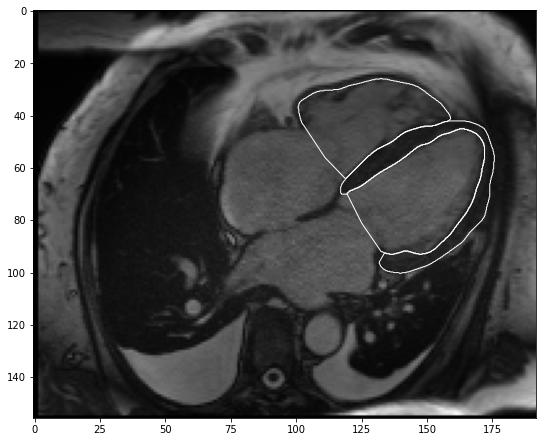

LAX 4CV LVED


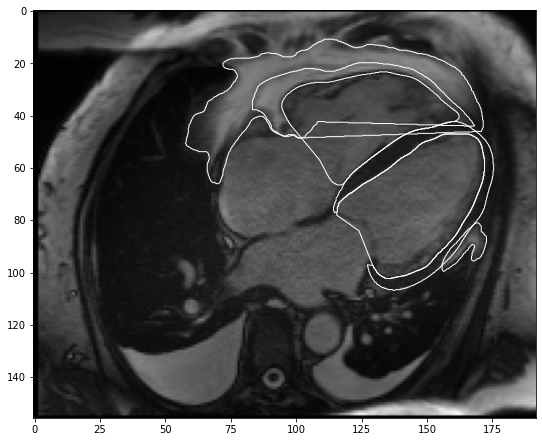


[<LazyLuna.Categories.LAX_4CV_LVES_Category object at 0x12f246130>, <LazyLuna.Categories.LAX_4CV_LVED_Category object at 0x12f2461c0>, <LazyLuna.Categories.LAX_4CV_RVES_Category object at 0x12f246250>, <LazyLuna.Categories.LAX_4CV_RVED_Category object at 0x12f2462e0>, <LazyLuna.Categories.LAX_4CV_LAES_Category object at 0x12f246370>, <LazyLuna.Categories.LAX_4CV_LAED_Category object at 0x12f246400>, <LazyLuna.Categories.LAX_4CV_RAES_Category object at 0x12f246490>, <LazyLuna.Categories.LAX_4CV_RAED_Category object at 0x12f246520>, <LazyLuna.Categories.LAX_2CV_LVES_Category object at 0x12f2465b0>, <LazyLuna.Categories.LAX_2CV_LVED_Category object at 0x12f246640>, <LazyLuna.Categories.LAX_2CV_LAES_Category object at 0x12f2466d0>, <LazyLuna.Categories.LAX_2CV_LAED_Category object at 0x12f246760>]
ECSPRESS-068
Clinical Results
LAX 4CV LVES


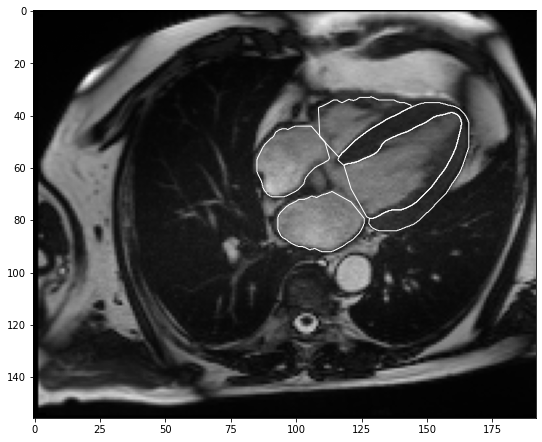

LAX 4CV LVED


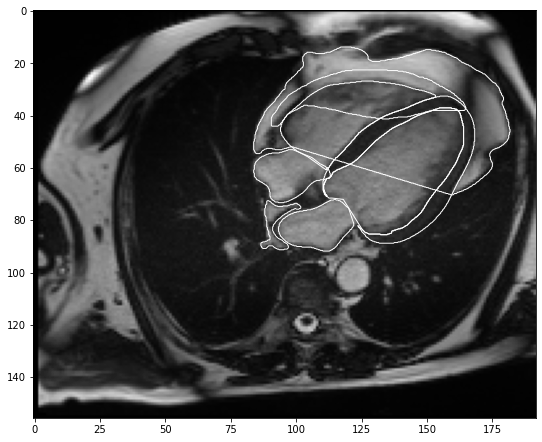

In [45]:
lax_cine_view = LAX_CINE_View()
for case in cases:
    print(case.categories)
    print(case.case_name)
    print('Clinical Results')
    case = lax_cine_view.customize_case(case)
    #for cr in case.crs:
    #    print(cr.name)
    #    print(cr.name, cr.get_cr(string=True), cr.unit)

    cats = ['LAX 4CV LVES', 'LAX 4CV LVED']
    for cat in case.categories:
        if cat.name in cats:
            print(cat.name)
            #for p in range(cat.nr_phases):
            fig, ax = plt.subplots(1,1,figsize=(9,9))
            img  = cat.get_img (0, cat.phase)
            anno = cat.get_anno(0, cat.phase)
            ax.imshow(img, cmap='gray')#; ax.axis('off')
            anno.plot_all_contour_outlines(ax)
            plt.show()
    print()

In [46]:
img_h, img_w, img_c, out_c = 128, 128, 1, 5
d, st_ch, dr = 5, 16, 0.1

#bp = '/media/omega/Daten1/CATCH/CS/Cases'
bp  = '/Users/dietrichhadler/Desktop/Daten/Fat/Cases'

epochs_max = 3
batch_size = 16
k = 0
k_max = 2
provide_validation_set = False

gen = CatchGenerator(bp_cases, epochs_max, batch_size, k, k_max, 
                     provide_validation_set, aug, no_aug)

Nr of cases:  2


<ipython-input-44-3115a28c7640>:50: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:52: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>

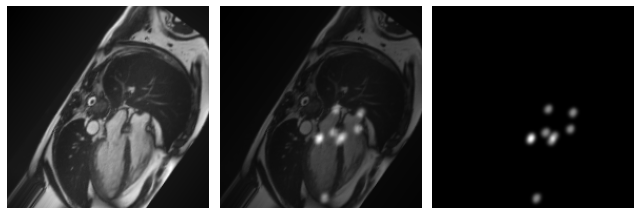

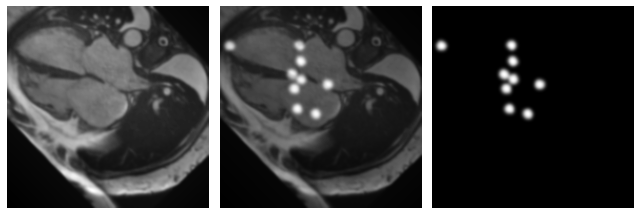

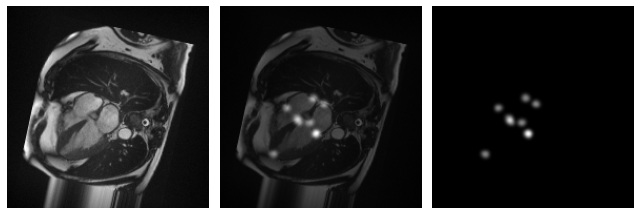

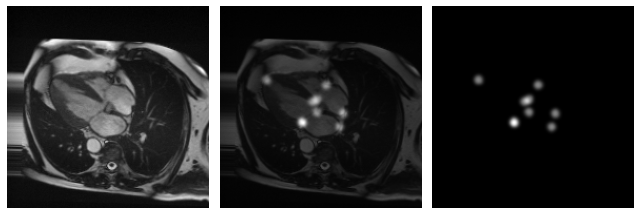

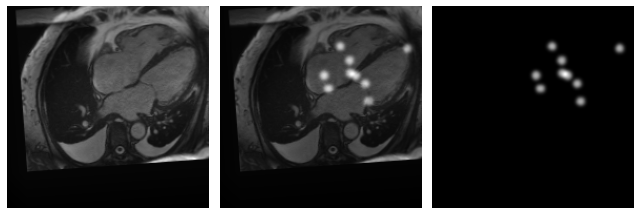

...

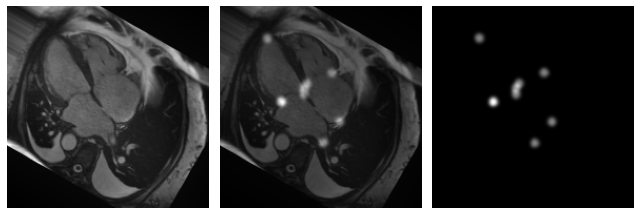

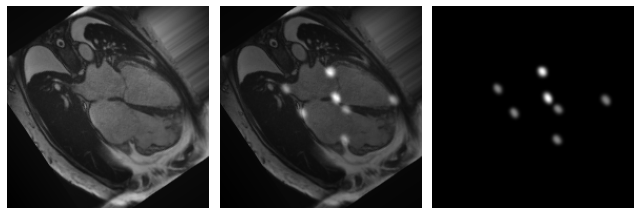

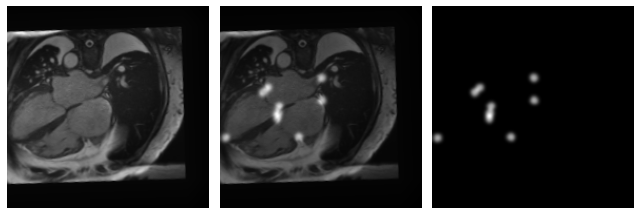

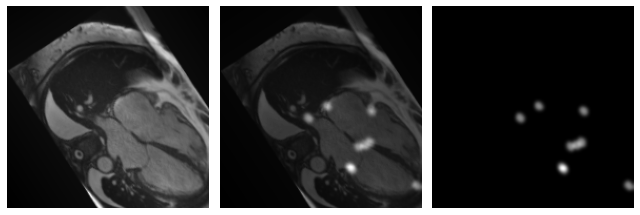

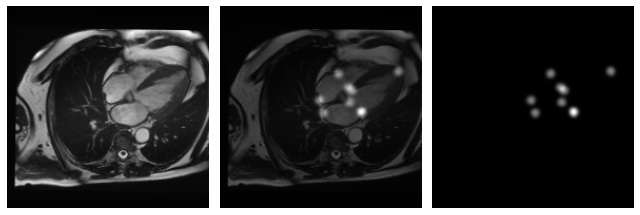

<ipython-input-47-3d1fdeeb4329>:11: RuntimeWarning: invalid value encountered in true_divide
  mask[:,:,k] = mask[:,:,k] / np.max(mask[:,:,k])


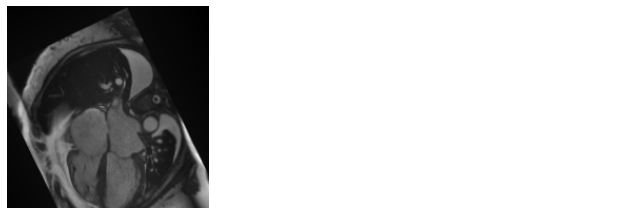

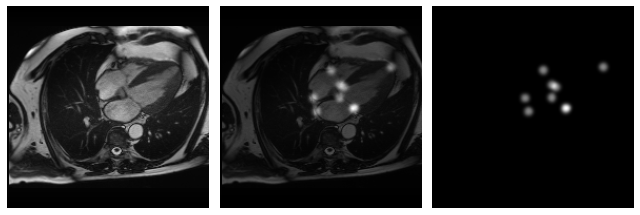

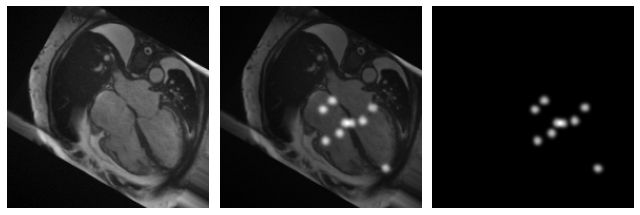

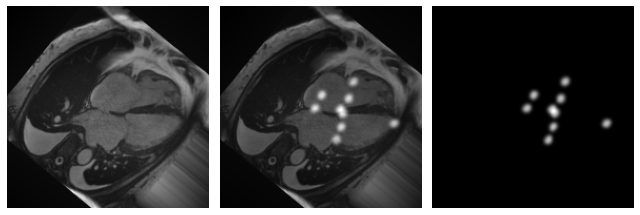

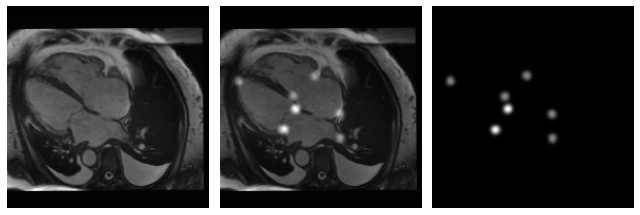

...

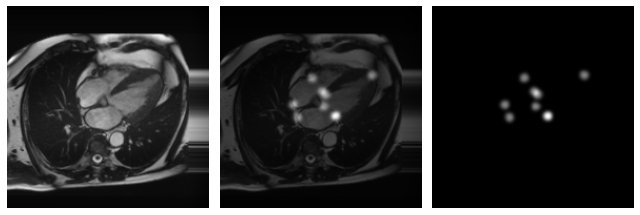

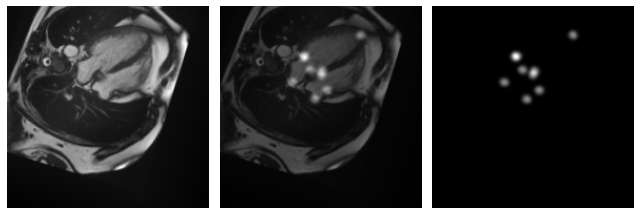

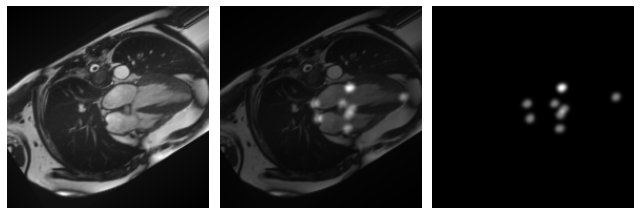

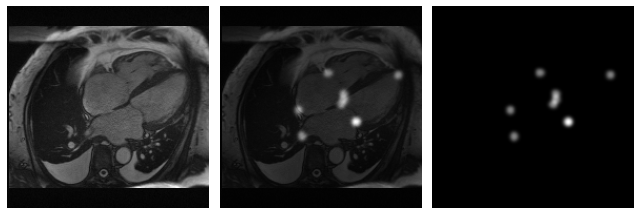

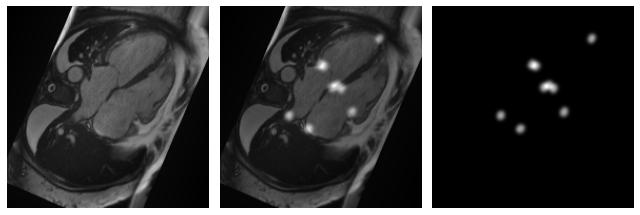

UnboundLocalError: local variable 'ra_ext1' referenced before assignment

In [47]:
for _ in range(10):
    img_batch, poly_batch = gen._unaugmented_batch()
    img_batch, poly_batch = aug(images=img_batch, polygons=poly_batch)

    for img, poly in zip(img_batch, poly_batch):
        h, w = img.shape
        mask = np.zeros((h, w, 9))
        for k in range(len(poly)):
            mask[:,:,k] = utils.to_mask(poly[k].to_shapely_polygon(), h, w)
            mask[:,:,k] = cv2.GaussianBlur(mask[:,:,k],(9,9),cv2.BORDER_CONSTANT)
            mask[:,:,k] = mask[:,:,k] / np.max(mask[:,:,k])
        fig, axes = plt.subplots(1,3,figsize=(9,23))
        for ax in axes: ax.axis('off')
        axes[0].imshow(img, cmap='gray')
        axes[1].imshow(img + np.sum(mask, axis=-1)*5, cmap='gray')
        axes[2].imshow(np.sum(mask, axis=-1), cmap='gray')
        fig.tight_layout()
        plt.show()

In [48]:
for img_batch, mask_batch in gen._multiprocessing_augmented_batches():
    for i in range(len(img_batch)):
        img, mask = img_batch[i], mask_batch[i]
        fig, ax = plt.subplots(1,1,figsize=(6,6))
        ax.imshow(img + np.sum(mask, axis=-1)*1.5, cmap='gray')
        plt.show()

<ipython-input-44-3115a28c7640>:50: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:52: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords


UnboundLocalError: local variable 'ra_ext1' referenced before assignment

<ipython-input-44-3115a28c7640>:50: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:52: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'bounding_boxes_aug', 'bounding_boxes_unaug', 'data', 'fill_from_augmented_normalized_batch', 'fill_from_augmented_normalized_batch_', 'get_column_names', 'heatmaps_aug', 'heatmaps_unaug', 'images_aug', 'images_unaug', 'keypoints_aug', 'keypoints_unaug', 'line_strings_aug', 'line_strings_unaug', 'polygons_aug', 'polygons_unaug', 'segmentation_maps_aug', 'segmentation_maps_unaug', 'to_normalized_batch']
Augmentation done in 0.00s
9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


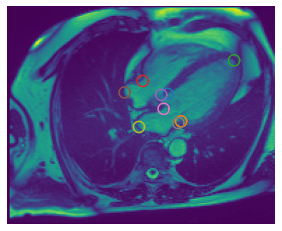

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


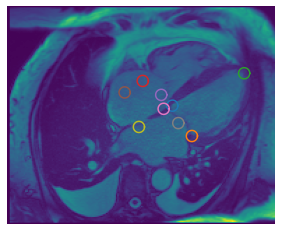

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


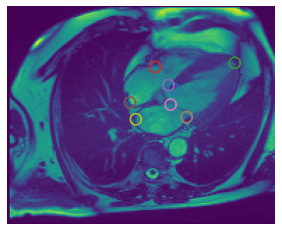

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


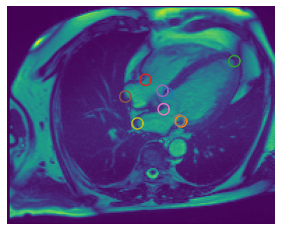

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


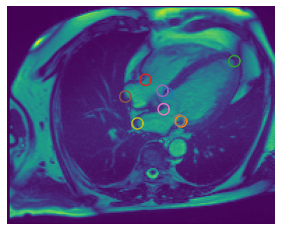

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


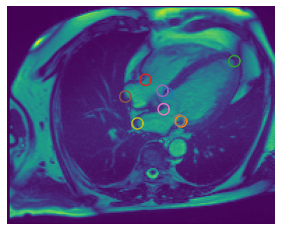

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


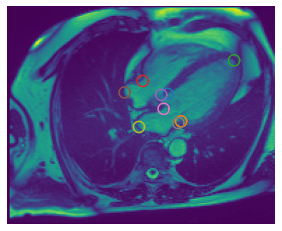

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


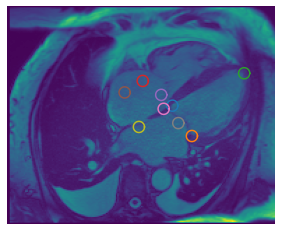

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


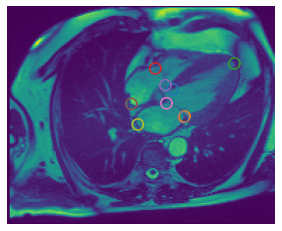

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


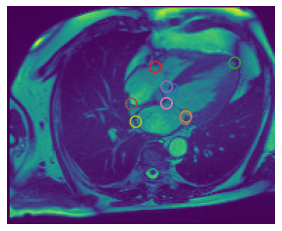

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


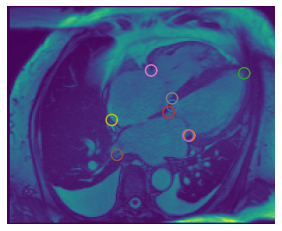

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


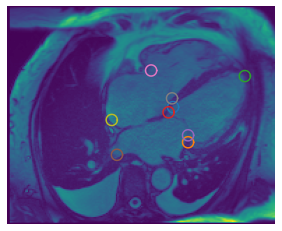

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


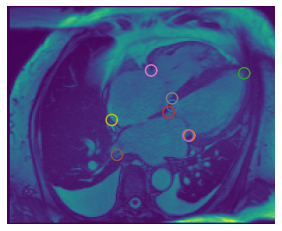

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


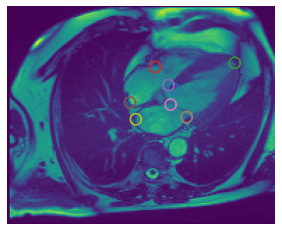

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


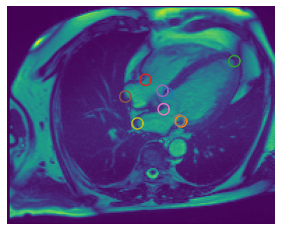

9
['lv_ext1', 'lv_ext2', 'lv_ext3', 'ra_ext1', 'ra_ext2', 'ra_ext3', 'la_ext1', 'la_ext2', 'la_ext3']
64
64
64
64
64
64
64
64
64


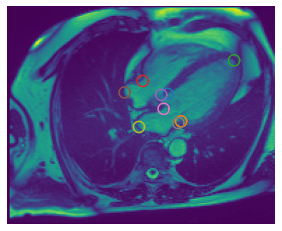

In [49]:
for _ in range(1):
    import time
    unaug  = gen._unaugmented_batch_generator()
    batch  = next(unaug)
    imgs1  = batch.images_unaug
    polys1 = batch.polygons_unaug

    time_start = time.time()
    #batches_aug = list(aug.augment_batches(batch, background=False))  # list() converts generator to list
    print(dir(batch))
    batches_aug = batch
    time_end = time.time()
    print("Augmentation done in %.2fs" % (time_end - time_start,))

    #imgs  = batches_aug[0].images_aug
    #polys = batches_aug[0].polygons_aug
    imgs  = batches_aug.images_unaug
    polys = batches_aug.polygons_unaug

    for i in range(batch_size):
        img, poly = imgs[i], polys[i]
        fig, ax = plt.subplots(1,1)
        ax.imshow(img); ax.axis('off')
        print(len(poly))
        print([p.label for p in poly])
        for p in poly:
            print(len(p.exterior))
            p   = np.concatenate((p.exterior, [p.exterior[0]]))
            x,y = zip(*p)
            ax.plot(x,y)
        plt.show()


In [50]:
for _ in range(1):
    import time
    unaug  = gen._unaugmented_batch_generator()
    batch  = next(unaug)
    imgs1  = batch.images_unaug
    polys1 = batch.polygons_unaug

    time_start = time.time()
    batches_aug = list(aug.augment_batches(batch, background=False))  # list() converts generator to list
    time_end = time.time()
    print("Augmentation done in %.2fs" % (time_end - time_start,))

    imgs  = batches_aug[0].images_aug
    polys = batches_aug[0].polygons_aug

    for i in range(batch_size):
        img, poly = imgs[i], polys[i]
        h, w = img.shape
        mask = np.zeros((h, w, 5))
        for j in range(len(poly)): mask[:,:,j] = to_mask(poly[j].to_shapely_polygon(), h, w)
            
        fig, axes = plt.subplots(1,2, figsize=(25,15))
        for j in range(2): axes[j].imshow(img, cmap='gray'); axes[j].axis('off')
        
        #['lv_lax_endo', 'lv_lax_epi', 'rv_lax_endo', 'ra', 'la']
        mask_sum = np.sum(mask, axis=-1)
        axes[1].imshow(img + mask_sum*5, cmap='gray')
        #axes[1].imshow(img + mask[:,:,0]*3 + mask[:,:,1]*3, cmap='gray')
        plt.show()

<ipython-input-44-3115a28c7640>:50: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:52: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>

Augmentation done in 0.21s


IndexError: index 5 is out of bounds for axis 2 with size 5

<ipython-input-44-3115a28c7640>:50: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext1 = lv_ext[0].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext2 = lv_ext[1].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>:52: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  lv_ext3 = lv_ext[2].buffer(4.0).simplify(0.01, preserve_topology=True).exterior.coords
<ipython-input-44-3115a28c7640>

5.766584e-05 0.0017662519290123457


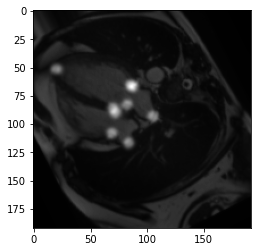

9.175804e-06 0.001669801311728395


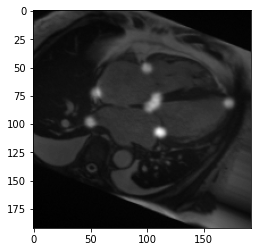

1.9868216e-08 0.0013804494598765433


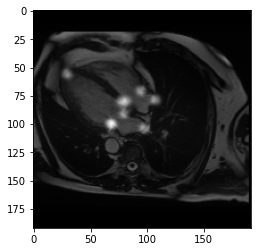

0.00010932982 0.0013834635416666667


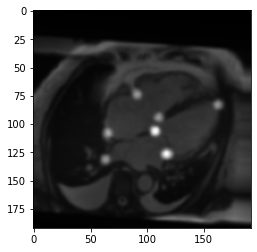

4.635917e-08 0.0013442804783950616


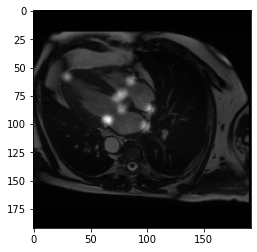

0.00033152435 0.0015884211033950616


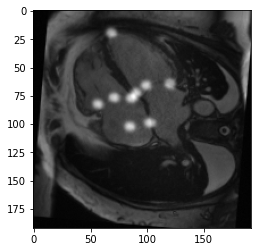

-7.947286e-08 0.0012719425154320988


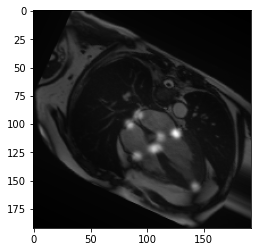

9.265211e-06 0.0013623649691358024


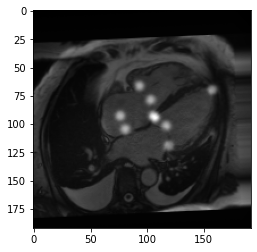

8.893261e-05 0.001247829861111111


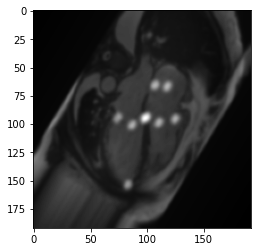

-5.2981907e-08 0.0011121961805555555


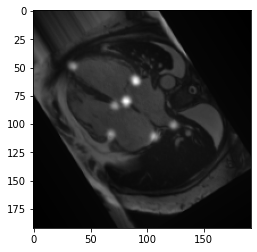

-9.6559525e-05 0.0013804494598765433


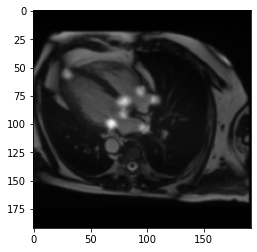

8.278423e-09 0.0012809847608024692


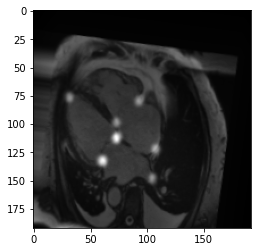

0.000119161276 0.0016667872299382716


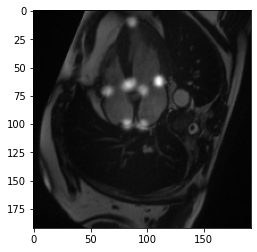

-3.3113693e-08 0.0013503557370032793


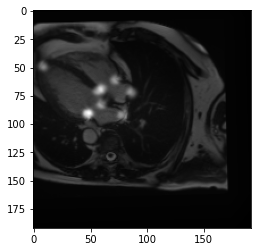

-5.2981907e-08 0.001425660686728395


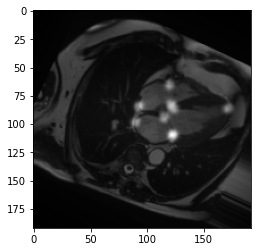

-9.7619166e-05 0.0013442804783950616


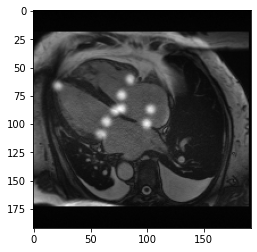

-3.081229e-05 0.0014949845679012345


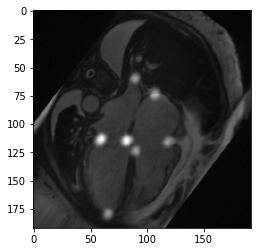

1.9868216e-08 0.0011302806712962963


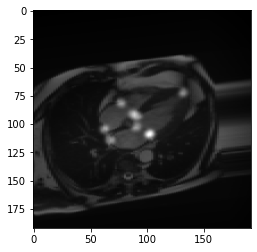

0.00018213193 0.0013804494598765433


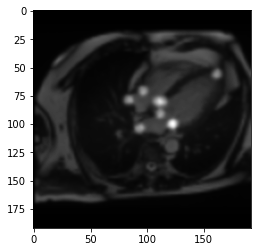

9.804302e-05 0.0009916329089506174


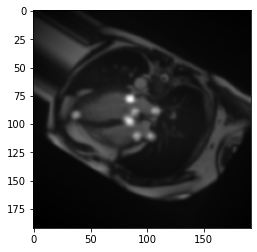

2.6490953e-08 0.0013623649691358024


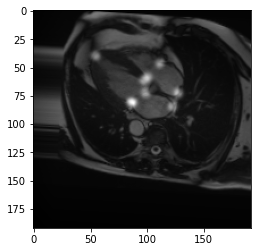

-5.2981907e-08 0.0014407310956790122


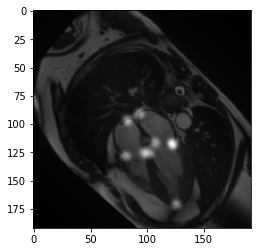

-2.0140575e-05 0.0013352382330246914


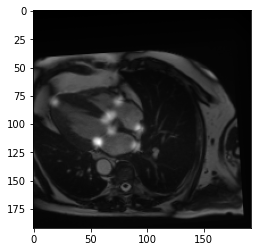

7.69496e-05 0.0013804494598765433


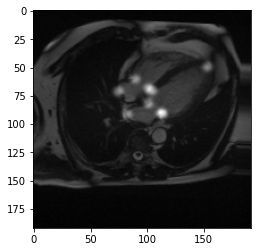

1.3079908e-07 0.001347294560185185


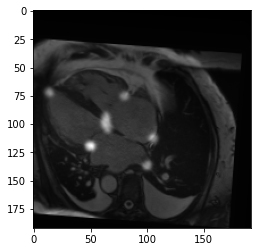

0.00045659806 0.001359350887345679


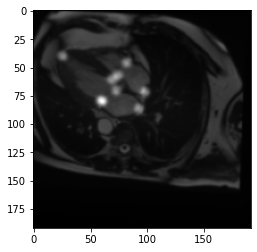

-0.00030464598 0.0014286747685185186


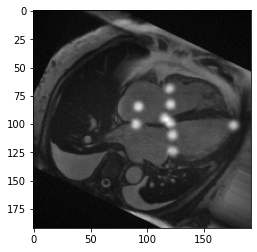

1.7219119e-07 0.0013774353780864198


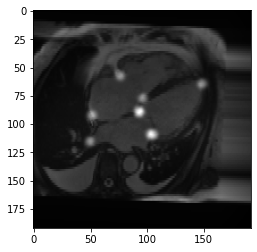

-4.9670536e-08 0.001470871913580247


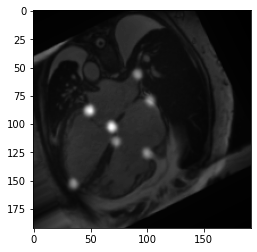

4.635917e-08 0.0013442804783950616


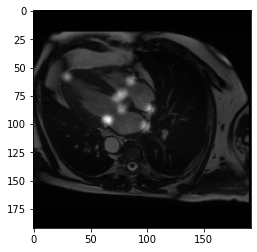

6.6227386e-08 0.0009675202546296296


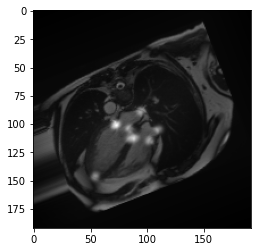

-0.00011783838 0.0013801551159517264


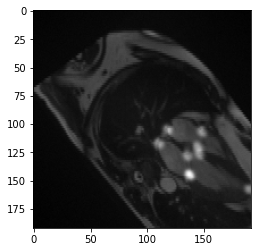

In [51]:
for img_batch, mask_batch in gen._multiprocessing_augmented_batches():
    for i in range(len(img_batch)):
        img, mask = img_batch[i], mask_batch[i]
        print(np.mean(img), np.mean(mask))
        plt.imshow(img + 5*np.sum(mask, axis=-1), cmap='gray')
        plt.show()

ECSPRESS-070 Gold
[<shapely.geometry.point.Point object at 0x163d9a970>, <shapely.geometry.point.Point object at 0x162ecee50>, <shapely.geometry.point.Point object at 0x162ecee80>]
None
None
First keypoints:
KeypointsOnImage([Keypoint(x=119.00000000, y=70.00000000), Keypoint(x=132.00000000, y=91.00000000), Keypoint(x=170.00000000, y=48.00000000)], shape=(156, 192))


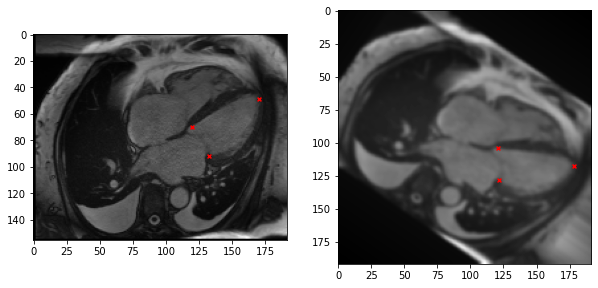

[<shapely.geometry.point.Point object at 0x1622c3910>, <shapely.geometry.point.Point object at 0x1622d1ee0>, <shapely.geometry.point.Point object at 0x1622d1520>]
None
None
First keypoints:
KeypointsOnImage([Keypoint(x=118.00000000, y=71.00000000), Keypoint(x=129.00000000, y=97.00000000), Keypoint(x=170.00000000, y=49.00000000)], shape=(156, 192))


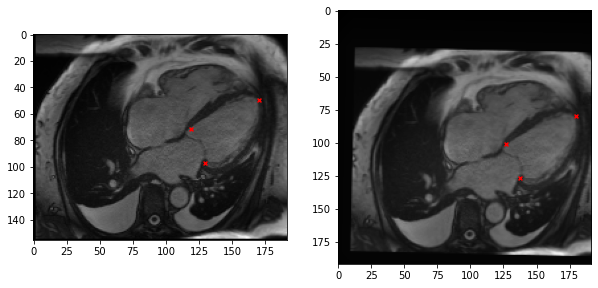

ECSPRESS-068 Gold
[<shapely.geometry.point.Point object at 0x1622d18b0>, <shapely.geometry.point.Point object at 0x1622d1dc0>, <shapely.geometry.point.Point object at 0x1622d1760>]
[<shapely.geometry.point.Point object at 0x1622d1f70>, <shapely.geometry.point.Point object at 0x162ce3af0>, <shapely.geometry.point.Point object at 0x1624b3dc0>]
[<shapely.geometry.point.Point object at 0x1624b3ee0>, <shapely.geometry.point.Point object at 0x1624b3fa0>, <shapely.geometry.point.Point object at 0x1624b3e80>]
First keypoints:
KeypointsOnImage([Keypoint(x=118.00000000, y=59.00000000), Keypoint(x=126.00000000, y=78.00000000), Keypoint(x=162.00000000, y=40.00000000), Keypoint(x=105.00000000, y=44.00000000), Keypoint(x=113.00000000, y=56.00000000), Keypoint(x=88.00000000, y=69.00000000), Keypoint(x=113.00000000, y=69.00000000), Keypoint(x=126.00000000, y=79.00000000), Keypoint(x=93.00000000, y=84.00000000)], shape=(156, 192))


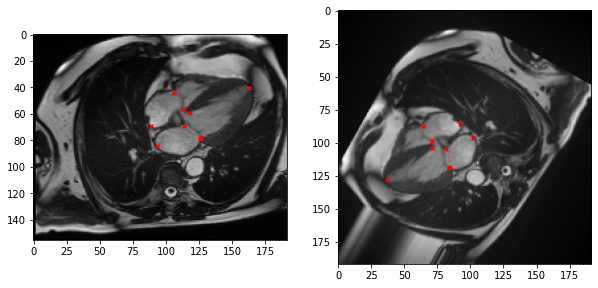

[<shapely.geometry.point.Point object at 0x1624b3e20>, <shapely.geometry.point.Point object at 0x1622d1e80>, <shapely.geometry.point.Point object at 0x1622d1eb0>]
[<shapely.geometry.point.Point object at 0x1622d1ac0>, <shapely.geometry.point.Point object at 0x1648959a0>, <shapely.geometry.point.Point object at 0x1648952b0>]
[<shapely.geometry.point.Point object at 0x164895b20>, <shapely.geometry.point.Point object at 0x164895280>, <shapely.geometry.point.Point object at 0x1648950d0>]
First keypoints:
KeypointsOnImage([Keypoint(x=114.00000000, y=62.00000000), Keypoint(x=124.00000000, y=82.00000000), Keypoint(x=162.00000000, y=38.00000000), Keypoint(x=98.00000000, y=52.00000000), Keypoint(x=111.00000000, y=60.00000000), Keypoint(x=84.00000000, y=64.00000000), Keypoint(x=111.00000000, y=73.00000000), Keypoint(x=123.00000000, y=81.00000000), Keypoint(x=93.00000000, y=83.00000000)], shape=(156, 192))


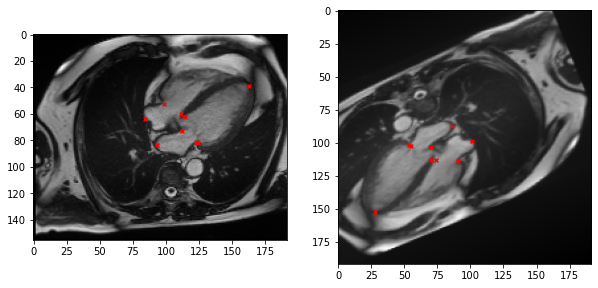

In [59]:
import imgaug as ia
from imgaug.augmentables.kps import Keypoint, KeypointsOnImage

for case in cases:
    print(case.case_name, case.reader_name)
    cat1  = [c for c in case.categories if c.name=='LAX 4CV LVES'][0]
    cat2  = [c for c in case.categories if c.name=='LAX 4CV LVED'][0]
    for cat in [cat1, cat2]:
        img   = cat.get_img (0, cat.phase).astype(np.float32)
        h, w  = img.shape
        anno  = cat.get_anno(0, cat.phase)
        ps1   = list(anno.get_point('lv_lax_extent').geoms)     if anno.has_point('lv_lax_extent')     else None
        ps2   = list(anno.get_point('laxRaExtentPoints').geoms) if anno.has_point('laxRaExtentPoints') else None
        ps3   = list(anno.get_point('laxLaExtentPoints').geoms) if anno.has_point('laxLaExtentPoints') else None
        print(ps1); print(ps2); print(ps3)
        ps = []
        if ps1 is not None: ps += ps1
        if ps2 is not None: ps += ps2
        if ps3 is not None: ps += ps3
        #try:                   ps = ps1 + ps2 + ps3
        #except Exception as e: print(e)

        kps = [Keypoint(x=int(p.x), y=int(p.y)) for p in ps]

        fig, axes = plt.subplots(1,2,figsize=(10,6))
        axes[0].imshow(img, cmap='gray')
        xs, ys = [point.x for point in ps], [point.y for point in ps]
        axes[0].scatter(xs, ys, c='r',s=15,marker='x')
        #plt.show()
        
        kpsoi = KeypointsOnImage(kps, shape=img.shape)
        print('First keypoints:')
        print(kpsoi)
        
        img_aug, kpsoi_aug = aug(image=img, keypoints=kpsoi)
        ps_aug = [(kp.x,kp.y) for kp in kpsoi_aug]
        #ia.imshow(kpsoi_aug.draw_on_image(img_aug, color=4, size=3))

        #print(kpsoi_aug[0].x, kpsoi_aug[0].y)
        ps_aug = [Point(p.x,p.y) for p in kpsoi_aug]
        #print('Augmented keypoints:')
        #print(kpsoi_aug)
        #for p in ps_aug: print(p.x, p.y)
        axes[1].imshow(img_aug, cmap='gray')
        xs, ys = [point.x for point in ps_aug], [point.y for point in ps_aug]
        axes[1].scatter(xs, ys, c='r',s=15,marker='x')
        plt.show()